# Spatial Transcriptomics Cluster Validation for HM-OT

In [1]:
import scanpy as sc
import anndata as ad
import numpy as np

import sys
import os
import importlib
os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"
import torch
sys.path.append(os.path.abspath(".."))

import src.HiddenMarkovOT as HiddenMarkovOT
import src.utils.util_LR as util_LR
from src.utils.util_LR import convert_adata
import src.plotting as plotting


In [2]:
import random

def seed_everything(seed: int = 42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)
    return

seed_everything(42)

In [3]:

filehandles_embryo_adata = [
                            '/scratch/gpfs/ph3641/mouse_embryo/E11.5_E1S1.MOSTA.h5ad', \
                            '/scratch/gpfs/ph3641/mouse_embryo/E12.5_E1S1.MOSTA.h5ad', \
                            '/scratch/gpfs/ph3641/mouse_embryo/E13.5_E1S1.MOSTA.h5ad'
                            ]

timepoints = [ 'E11.5', 'E12.5', 'E13.5'] 

# Load adatas and set count layer and timepoints
print('Loading mouse-embryo AnnDatas')
adatas = []
for i, fh in enumerate(filehandles_embryo_adata):
    adata = sc.read_h5ad(fh)
    adata.X = adata.layers['count']
    adata.obs['timepoint'] = [timepoints[i]] * adata.shape[0]
    adatas.append(adata)

# Find intersection of genes across all adatas
common_genes = set(adatas[0].var.index)
for adata in adatas[1:]:
    common_genes &= set(adata.var.index)
common_genes = list(common_genes)

# Subset each adata to the common genes
adatas = [adata[:, common_genes] for adata in adatas]
adata_pairs = []

print('Starting PCA')

# Compute pairwise PCA (so it's scalable) for each AnnData (t, t+1)
for i in range(len(adatas) - 1):
    ad1, ad2 = adatas[i], adatas[i+1]
    t1, t2 = timepoints[i], timepoints[i+1]
    
    # 1) Normalize + log-transform both slices independently
    joint = ad.concat([ad1, ad2], join='inner')
    sc.pp.normalize_total(joint)
    sc.pp.log1p(joint)
    sc.pp.pca(joint, n_comps=30)
    # Free up memory by clearing X and heavy layers
    joint.X = None
    if 'count' in joint.layers:
        del joint.layers['count']
    adata_pairs.append(joint)

print('PCA Finished!')

save_dir = '/scratch/gpfs/ph3641/mouse_embryo/pca_pairs_ME/'
os.makedirs(save_dir, exist_ok=True)

# Save pairs
for i, joint in enumerate(adata_pairs):
    fname = f'{save_dir}/embryo_pair_{timepoints[i]}_{timepoints[i+1]}.h5ad'
    joint.write(fname)


Loading mouse-embryo AnnDatas
Starting PCA


/home/ph3641/.local/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/ph3641/.local/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


PCA Finished!


In [4]:

filehandles_pca_pairs = [
    '/scratch/gpfs/ph3641/mouse_embryo/pca_pairs/embryo_pair_E11.5_E12.5.h5ad',
    '/scratch/gpfs/ph3641/mouse_embryo/pca_pairs/embryo_pair_E12.5_E13.5.h5ad'
]

adata_pairs = [sc.read_h5ad(fh) for fh in filehandles_pca_pairs]

/home/ph3641/.local/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/home/ph3641/.local/lib/python3.12/site-packages/anndata/_core/anndata.py:1756: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


In [5]:

from src.utils.util_LR import convert_adata_pairwise

# Set torch device (GPU if available)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Convert AnnData in HM-OT ready factors
C_factors_sequence, A_factors_sequence, Qs, labels, rank_list, spatial_list = convert_adata_pairwise(adata_pairs,
                                                                                    timepoints=timepoints,
                                                                                     timepoint_key = 'timepoint',
                                                                                     replicate_key = 'embryo_id',
                                                                                     feature_key = 'X_pca',
                                                                                     cell_type_key = 'annotation',
                                                                                     spatial = True,
                                                                                     spatial_key = ['x_loc', 'y_loc'],
                                                                                     fallback_spatial_key = 'spatial',
                                                                                     dist_eps = 0.02,
                                                                                     dist_rank = 100,
                                                                                     dist_rank_2 = 50,
                                                                                     device = device,
                                                                                    normalize=True
                                                                                )


In [6]:
import src.utils.clustering as clustering
from sklearn.metrics import adjusted_mutual_info_score as ami
from sklearn.metrics import adjusted_rand_score as ari

importlib.reload(HiddenMarkovOT)

num_iter = 10
running_min_cost = torch.inf

for i in range(num_iter):

    # Set a replicable random seed
    gen = torch.Generator(device=device)
    gen.manual_seed(i + 42)
    
    # Initialize HM-OT
    hmot_p = HiddenMarkovOT.HM_OT(
                                rank_list = rank_list[:-1],
                                tau_in = 1e-3,
                                tau_out = 1e-3,
                                gamma = 80,
                                max_iter = 100,
                                min_iter = 100,
                                device=device,
                                alpha = 0.9999,
                                dtype = torch.float32,
                                printCost = False,
                                returnFull = False,
                                initialization = 'Full',
                                generator = gen
                               )
    
    # Run HM-OT with Qs_IC from only timepoint 1, and freeze it
    hmot_p.gamma_smoothing(C_factors_sequence[:-1],
                         A_factors_sequence[:-1],
                         Qs_IC = [Qs[0], None],
                         Qs_freeze = [True, False],
                        warmup = False
                        )
    
    if hmot_p.compute_total_cost(C_factors_sequence[:-1], A_factors_sequence[:-1]) < running_min_cost:
        hmot_partial = hmot_p


Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 2.5131270398048855e-09; cost_GW: 4.3412873296233556e-10, cost_W: 2.0790415874216706e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 2.513981689489242e-09; cost_GW: 4.4164233381494e-10, cost_W: 2.072383722406812e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 2.5076216658703743e-09; cost_GW: 4.3649867054185165e-10, cost_W: 2.0711666365968995e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 2.5092115052416375e-09; cost_GW: 4.3830106211117936e-10, cost_W: 2.0709543605335057e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 2.5069104570007994e-09; cost_GW: 4.3771658519986545e-10, cost_W: 2.0692377802333795e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 2.5073698672883893e-09; cost_GW: 4.3659120763095416e-10, cost_W: 2.0708224838017486e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 2.506168

slice 0
ami of predictions: 1.000 for slice 0 (gamma)
ari of predictions: 1.000 for slice 0 (gamma)
slice 1
ami of predictions: 0.486 for slice 1 (gamma)
ari of predictions: 0.299 for slice 1 (gamma)


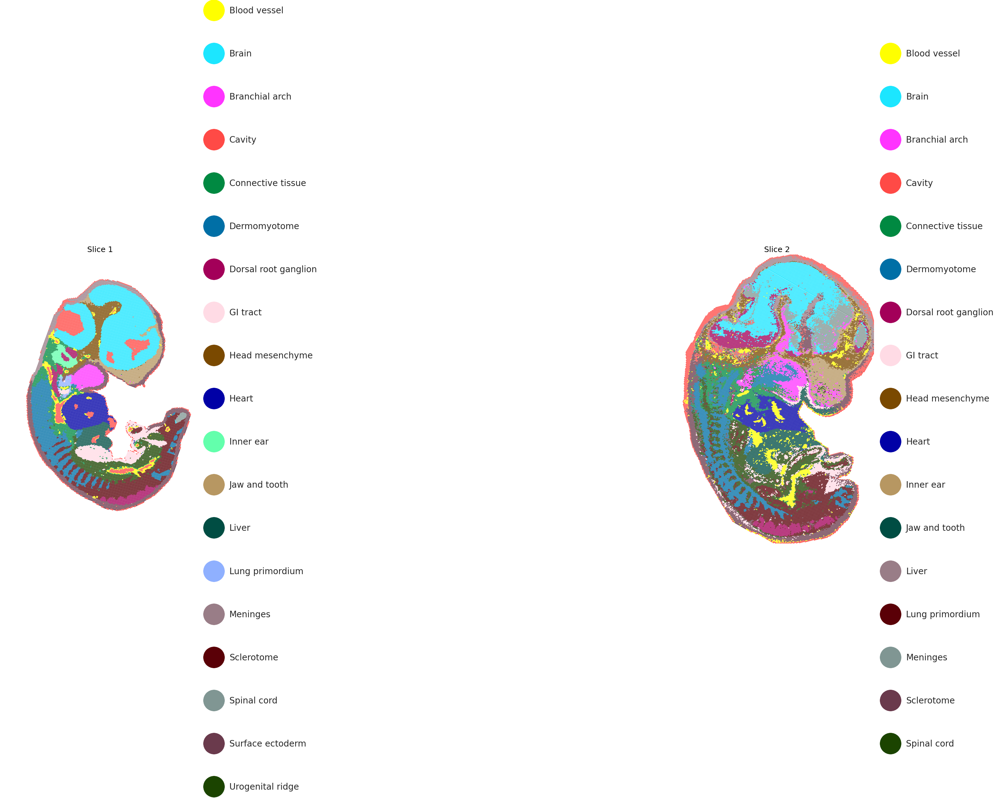

In [7]:


# Extract outputs
Qs_hmot_partial = [Q.cpu().numpy() for Q in hmot_partial.Q_gammas]
Ts_hmot_partial = [T.cpu().numpy() for T in hmot_partial.T_gammas]

# Plotting results
Qs_ann = [Q.cpu().numpy() for Q in Qs]
Qs_hmot_partial = [Q.cpu().numpy() for Q in hmot_partial.Q_gammas]
Ts_hmot_partial = [T.cpu().numpy() for T in hmot_partial.T_gammas]

clusterings_ann = clustering.max_likelihood_clustering(Qs_ann, mode='standard')
#clusterings_hmot = clustering.max_likelihood_clustering(Qs_hmot_partial, mode='standard')
clusterings_hmot = clustering.reference_clustering(
                Qs = Qs_hmot_partial,
                Ts = Ts_hmot_partial,
                reference_index = 0
                )

for i, gt_types in enumerate(clusterings_ann[:-1]):
    
    print(f'slice {i}')
    
    pred_types = clusterings_hmot[i]
    
    print(f"ami of predictions: {ami(gt_types, pred_types):.3f} for slice {i} (gamma)")
    print(f"ari of predictions: {ari(gt_types, pred_types):.3f} for slice {i} (gamma)")

# Visualize the transfer from time 1 to time 2
plotting.plot_clusters_from_QT(spatial_list[:-1], Qs_hmot_partial,
                               Ts_hmot_partial, [labels[0], labels[0]], clustering_type='reference',
                               reference_index=0, flip=True, dotsize=10)


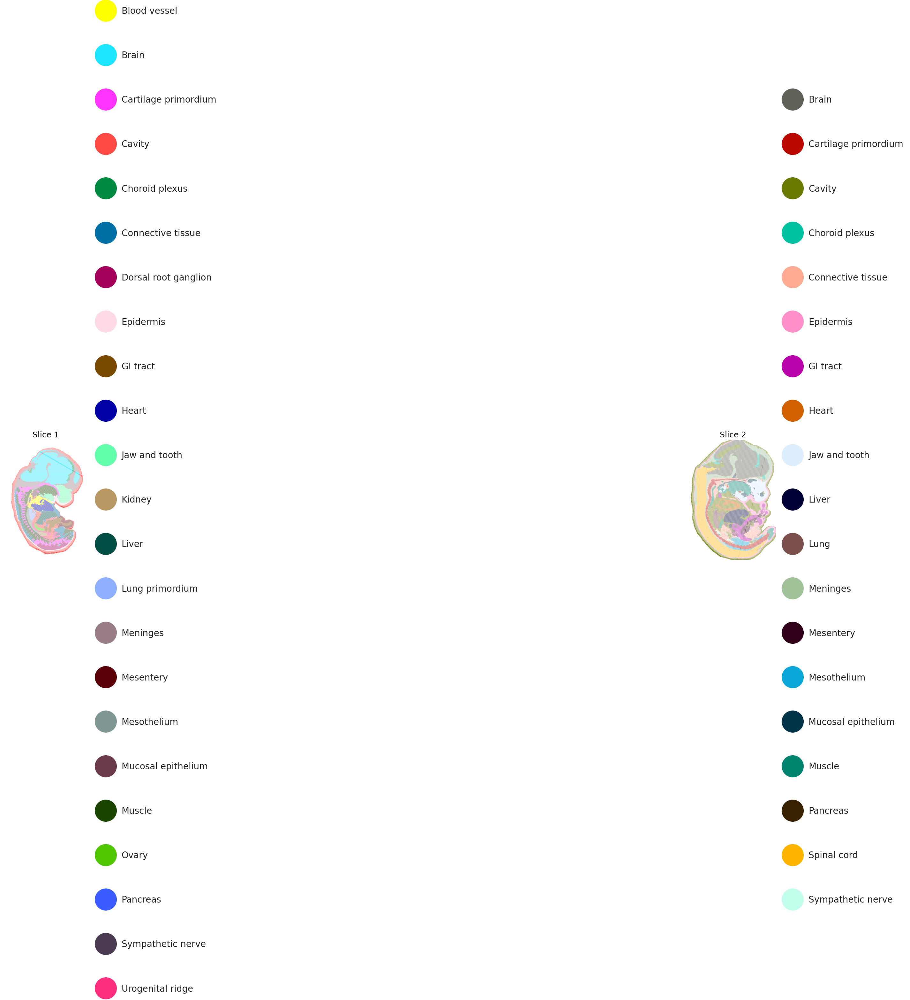

In [8]:

#plotting.plot_clusters_from_QT(spatial_list[:-1], Qs_ann[:-1], None, labels[:-1], flip=True, dotsize=10)

plotting.plot_clusters_from_QT(spatial_list[1:], Qs_ann[1:], None, labels[1:], flip=True, dotsize=10)



In [9]:
label_t1 = labels[0]
label_t2 = labels[1]

clustering_hmot_t1 = [label_t1[int(entry)] for entry in clusterings_hmot[0]]
clustering_hmot_t2 = [label_t1[int(entry)] for entry in clusterings_hmot[1]]
clustering_ann_t1 = [label_t1[int(entry)] for entry in clusterings_ann[0]]
clustering_ann_t2 = [label_t2[int(entry)] for entry in clusterings_ann[1]]

# Intersection of HM-OT clusters
common_cluster_labels_1 = np.intersect1d(np.unique(clustering_hmot_t1), 
                                         np.unique(clustering_hmot_t2))
print(f'T1, T2 intersected clusters (hmot): {len(common_cluster_labels_1)}')
# Intersection of Annot. clusters
common_cluster_labels_2 = np.intersect1d(np.unique(clustering_ann_t1), 
                                         np.unique(clustering_ann_t2))
print(f'T1, T2 intersected clusters (annot): {len(common_cluster_labels_2)}')
# Intersection of both for consistent comparison
common_cluster_labels = np.intersect1d(common_cluster_labels_2, 
                                       common_cluster_labels_1)
print(f'T1, T2 intersected clusters (both): {len(common_cluster_labels)}')

T1, T2 intersected clusters (hmot): 17
T1, T2 intersected clusters (annot): 12
T1, T2 intersected clusters (both): 11


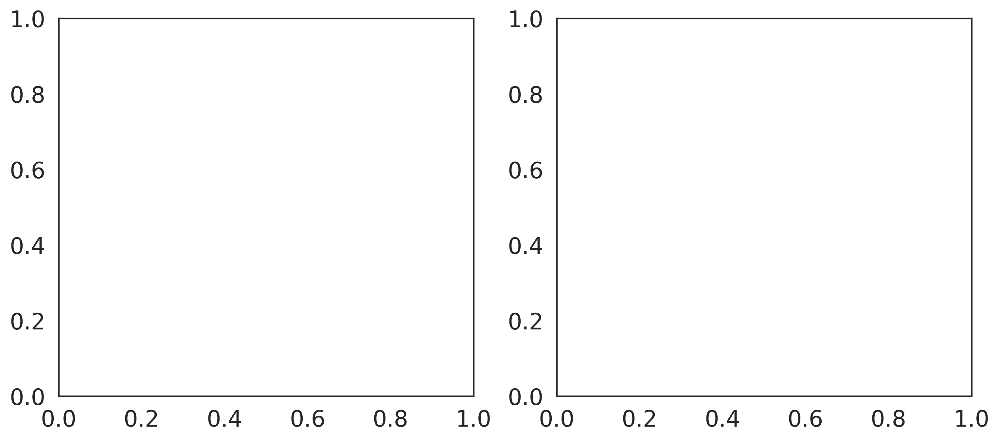

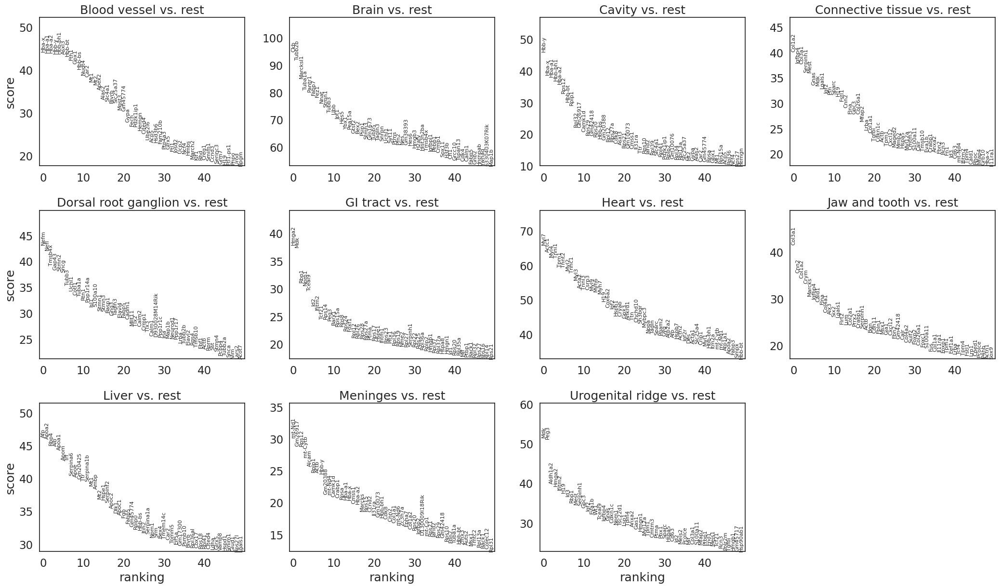

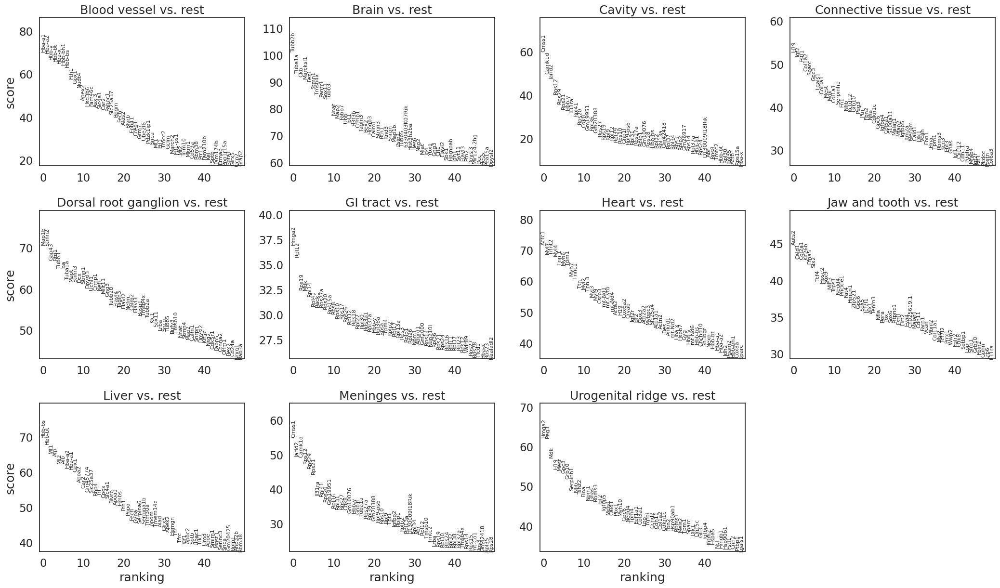

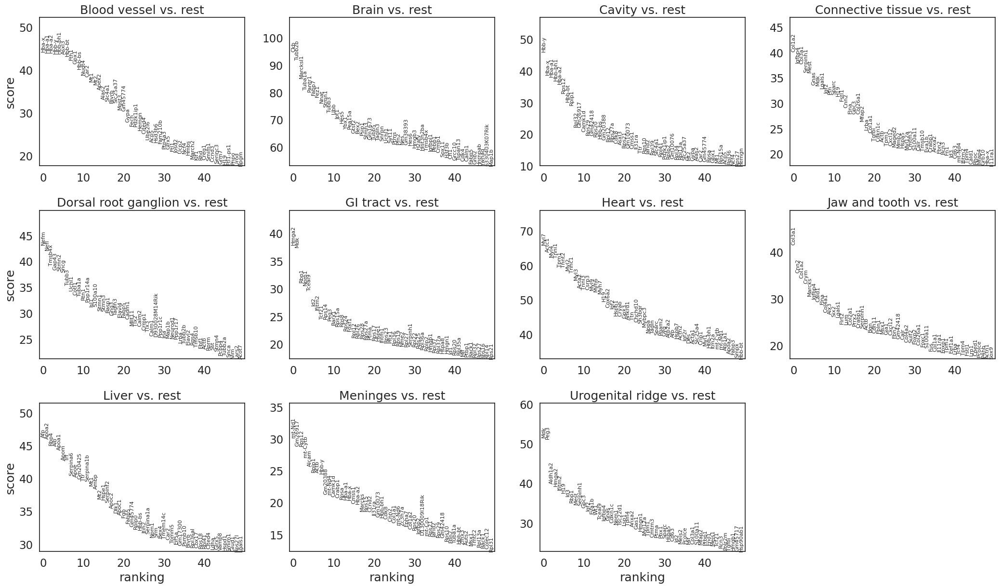

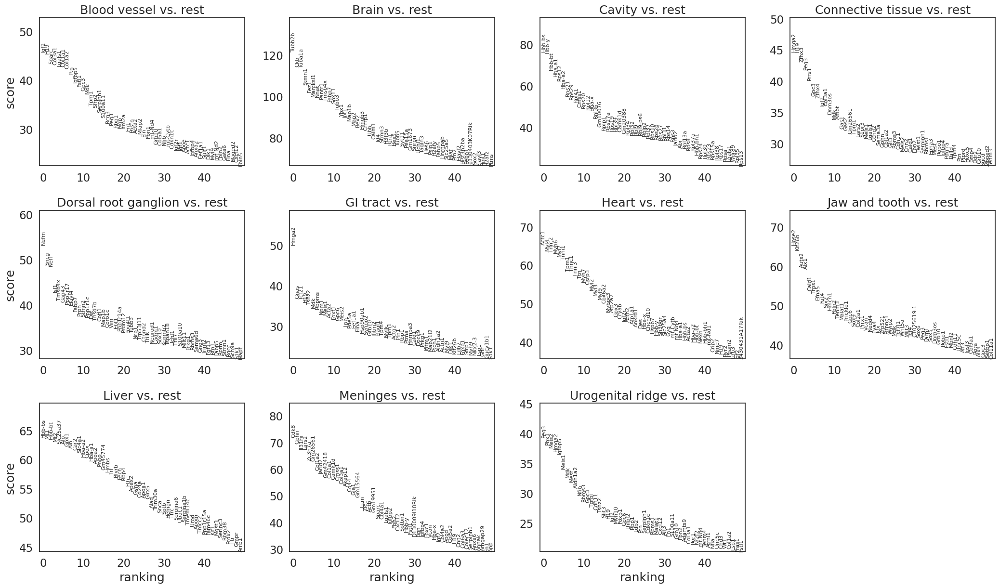

In [10]:
import clustering_validation as cv
import matplotlib.pyplot as plt
importlib.reload(cv)

fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

J1 = cv.get_Jaccard_Table(
    adatas[0], adatas[1],
    clustering_hmot_t1, clustering_hmot_t2,
    cluster_label='cluster',
    n_top_genes=50,
    overlap_lst=common_cluster_labels
)
J2 = cv.get_Jaccard_Table(
    adatas[0], adatas[1],
    clustering_ann_t1, clustering_ann_t2,
    cluster_label='cluster_ann',
    n_top_genes=50,
    overlap_lst=common_cluster_labels
)


starting DE
DE finished


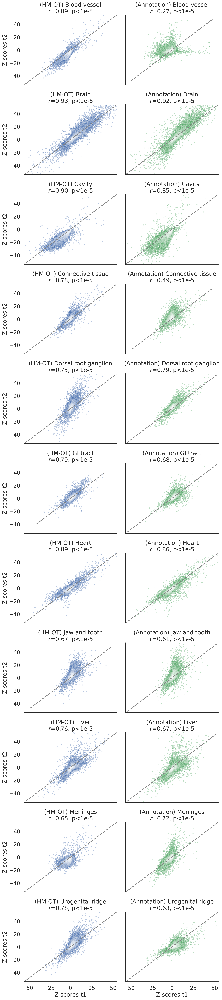

/tmp/ipykernel_2589569/2674914103.py:106: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')


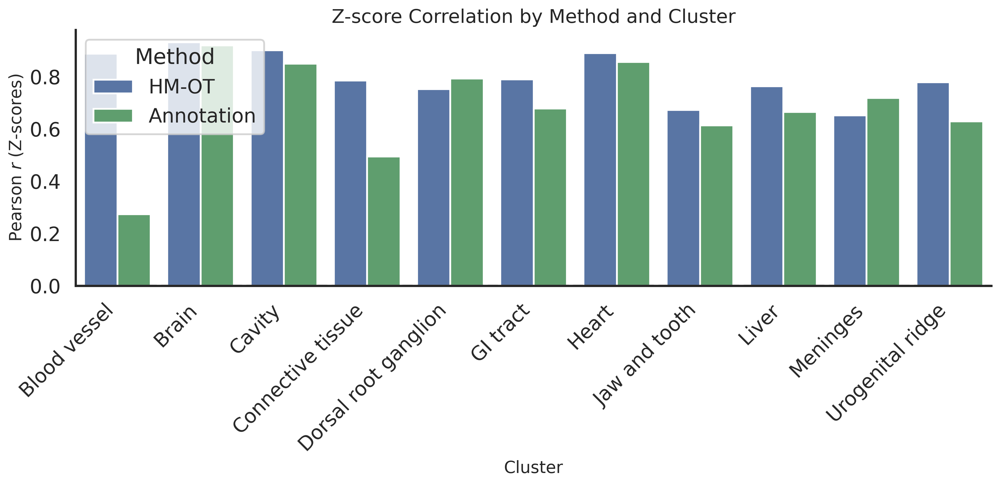

In [10]:
"""
import seaborn as sns
import pandas as pd
from scipy.stats import pearsonr

def compute_de_zscores(adata, clustering, cluster_label='cluster', n_top_genes=50, overlap_lst=None):
    
    """Annotate `adata.obs[cluster_label]` = clustering, run DE, and return dict of DataFrames."""
    if overlap_lst is not None:
        mask = np.isin(clustering, overlap_lst)
        ad = adata[mask].copy()
        clustering = np.array(clustering)[mask]
    else:
        ad = adata.copy()
        
    ad.obs[cluster_label] = clustering
    sc.pp.normalize_total(ad)
    sc.pp.log1p(ad)
    ad.obs[cluster_label] = ad.obs[cluster_label].astype('category')
    sc.tl.rank_genes_groups(ad, groupby=cluster_label, method='wilcoxon')
    de = ad.uns['rank_genes_groups']
    groups = de['names'].dtype.names
    out = {}
    for g in groups:
        out[g] = pd.DataFrame({
            'gene': de['names'][g],
            'zscore': de['scores'][g]
        }).set_index('gene')
    return out
    
print('starting DE')
de1_A = compute_de_zscores(adatas[0], clustering_hmot_t1, cluster_label='cluster', overlap_lst=common_cluster_labels)
de2_A = compute_de_zscores(adatas[1], clustering_hmot_t2, cluster_label='cluster', overlap_lst=common_cluster_labels)
de1_B = compute_de_zscores(adatas[0], clustering_ann_t1, cluster_label='cluster_ann', overlap_lst=common_cluster_labels)
de2_B = compute_de_zscores(adatas[1], clustering_ann_t2, cluster_label='cluster_ann', overlap_lst=common_cluster_labels)
print('DE finished')

sns.set_context("talk")
sns.set_style("white")
palette = ["#4C72B0", "#55A868"]

#shared = sorted(set(de1_A) & set(de2_A) & set(de1_B) & set(de2_B))
shared_clusters = common_cluster_labels
n = len(shared_clusters)


fig, axes = plt.subplots(n, 2, figsize=(10, 4*n), sharex=True, sharey=True, dpi=300)
summary = []


for i, c in enumerate(shared_clusters):
    # collect common genes
    common_A = de1_A[c].index.intersection(de2_A[c].index)
    common_B = de1_B[c].index.intersection(de2_B[c].index)
    # optionally restrict to top n_top_genes
    common = common_A.intersection(common_B)
    if len(common) < 10:
        continue

    z1_A = de1_A[c].loc[common, 'zscore']
    z2_A = de2_A[c].loc[common, 'zscore']
    z1_B = de1_B[c].loc[common, 'zscore']
    z2_B = de2_B[c].loc[common, 'zscore']

    rA, pA = pearsonr(z1_A, z2_A)
    rB, pB = pearsonr(z1_B, z2_B)
    pstrA = "p<1e-5" if pA < 1e-5 else f"p={pA:.1e}"
    pstrB = "p<1e-5" if pB < 1e-5 else f"p={pB:.1e}"
    
    summary.append({'Cluster': c, 'Method': 'HM‑OT', 'r': rA, 'p': pA})
    summary.append({'Cluster': c, 'Method': 'Annotation', 'r': rB, 'p': pB})
    
    # HM-OT plot
    axA = axes[i, 0]
    lim = np.max(np.abs(np.concatenate([z1_A, z2_A]))) * 1.05
    sns.scatterplot(x=z1_A, y=z2_A, ax=axA, color=palette[0], s=10, alpha=0.4)
    axA.plot([-lim, lim], [-lim, lim], ls='--', color='gray')
    axA.set_xlim(-lim, lim)
    axA.set_ylim(-lim, lim)
    axA.set_title(f"(HM‑OT) {c}\n$r$={rA:.2f}, {pstrA}")
    if i == len(shared_clusters) - 1:
        axA.set_xlabel("Z-scores t1")
    axA.set_ylabel("Z-scores t2")
    sns.despine(ax=axA)
    
    # Annotation plot
    axB = axes[i, 1]
    lim = np.max(np.abs(np.concatenate([z1_B, z2_B]))) * 1.05
    sns.scatterplot(x=z1_B, y=z2_B, ax=axB, color=palette[1], s=10, alpha=0.4)
    axB.plot([-lim, lim], [-lim, lim], ls='--', color='gray')
    axB.set_xlim(-lim, lim)
    axB.set_ylim(-lim, lim)
    axB.set_title(f"(Annotation) {c}\n$r$={rB:.2f}, {pstrB}")
    if i == len(shared_clusters) - 1:
        axB.set_xlabel("Z-scores t1")
    axB.set_ylabel("")
    sns.despine(ax=axB)

plt.tight_layout()
plt.show()
# --- Bar plot summary ---
df_summary = pd.DataFrame(summary)

plt.figure(figsize=(12, 6), dpi=300)
ax = sns.barplot(data=df_summary, x='Cluster', y='r', hue='Method', palette=palette)

ax.set_ylabel("Pearson $r$ (Z-scores)", fontsize=14)
ax.set_xlabel("Cluster", fontsize=14)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
ax.set_title("Z-score Correlation by Method and Cluster", fontsize=16)
ax.axhline(0, linestyle='--', color='gray')
sns.despine()
plt.tight_layout()
plt.show()
"""

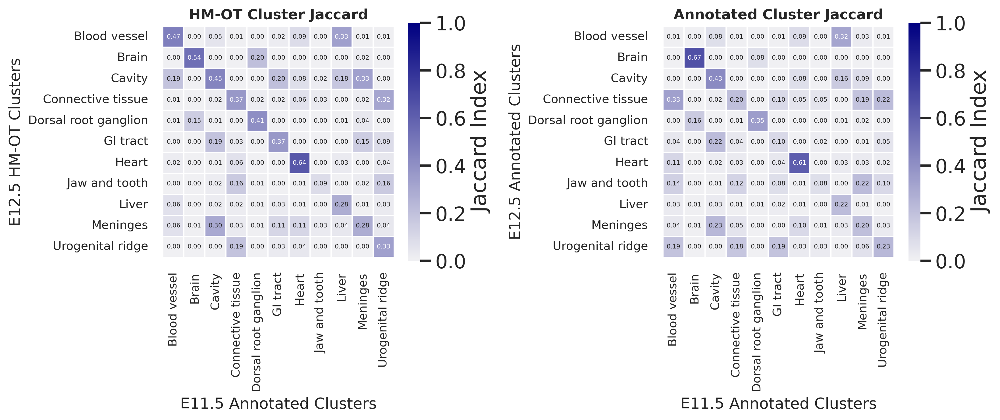

<Figure size 640x480 with 0 Axes>

In [11]:
importlib.reload(cv)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

cv.plot_jaccard_matrix(J1, ax1, annot_text=True, title="HM-OT Cluster Jaccard",
                       x_lab='E11.5 Annotated Clusters', y_lab='E12.5 HM-OT Clusters')
cv.plot_jaccard_matrix(J2, ax2, annot_text=True, title="Annotated Cluster Jaccard",
                       x_lab='E11.5 Annotated Clusters', y_lab='E12.5 Annotated Clusters')

plt.tight_layout()
plt.show()

ax1.set_title("HM-OT Cluster Jaccard")
ax2.set_title("Annotated Cluster Jaccard")

plt.tight_layout()
plt.show()


In [11]:
NumHigher = np.sum(np.diag(J1.to_numpy()) > np.diag(J2.to_numpy())) 
Total = J1.to_numpy().shape[0]

print(f'{NumHigher}/{Total} with better Jaccard scores, for fraction { NumHigher/Total }')

10/11 with better Jaccard scores, for fraction 0.9090909090909091


In [12]:

J1_np = J1.to_numpy()
J2_np = J2.to_numpy()

K = 50
N = adata.shape[1]

jaccard_null = (K / (2*N - K))

statistic = lambda x, y: np.mean(x) - np.mean(y)

diag_J1 = np.diag(J1_np)
diag_J2 = np.diag(J2_np)

from scipy.stats import ttest_1samp

t_stat, p_val = ttest_1samp(diag_J1, jaccard_null, alternative='greater')
print(f"One-sample t-test p-value: {p_val:.4g}")

t_stat, p_val = ttest_1samp(diag_J2, jaccard_null, alternative='greater')
print(f"One-sample t-test p-value: {p_val:.4g}")


One-sample t-test p-value: 2.772e-06
One-sample t-test p-value: 0.0006747


In [13]:
# Mean Jaccard scores
print(np.mean(np.diag(J1_np)))
print(np.mean(np.diag(J2_np)))

0.3845671408333835
0.28249838628869955


In [14]:
print(jaccard_null)

0.0008808089349258359


In [23]:
seed_everything(42)

num_iter = 10
running_min_cost = torch.inf

for i in range(num_iter):

    # Set a replicable random seed
    gen = torch.Generator(device=device)
    gen.manual_seed(i + 42)
    
    hmot_p = HiddenMarkovOT.HM_OT(
                                rank_list[1:],
                                tau_in = 1e-3,
                                tau_out = 1e-3,
                                gamma = 80,
                                max_iter = 100,
                                min_iter = 100,
                                device=device,
                                alpha = 0.9999,
                                dtype = torch.float32,
                                printCost = False,
                                returnFull = False,
                                initialization = 'Full',
                                generator = gen
                               )
    
    hmot_p.gamma_smoothing(C_factors_sequence[1:],
                         A_factors_sequence[1:],
                         Qs_IC = [None, Qs[2]],
                         Qs_freeze = [False, True],
                        warmup = False
                        )
    
    if hmot_p.compute_total_cost(C_factors_sequence[1:], A_factors_sequence[1:]) < running_min_cost:
        hmot_partial = hmot_p



Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 1.4577106188795597e-09; cost_GW: 1.6546837511288714e-10, cost_W: 1.2922589121444616e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 1.4578261930964231e-09; cost_GW: 1.6382305234596828e-10, cost_W: 1.2940196029376239e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 1.4559468075603377e-09; cost_GW: 1.6384534007318763e-10, cost_W: 1.2921179404656868e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 1.4598684483502211e-09; cost_GW: 1.6887082010530463e-10, cost_W: 1.291014541493496e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 1.4555345817512944e-09; cost_GW: 1.643732511213969e-10, cost_W: 1.2911778867419343e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 1.4578207530036025e-09; cost_GW: 1.6485378340203027e-10, cost_W: 1.2929835065733641e-05
Iteration: 0
Iteration: 25
Iteration: 50
Iteration: 75
Final Cost: 1.456

In [24]:
import src.utils.clustering as clustering
from sklearn.metrics import adjusted_mutual_info_score as ami
from sklearn.metrics import adjusted_rand_score as ari

# Plotting results
Qs_ann = [Q.cpu().numpy() for Q in Qs]
Qs_hmot_partial = [Q.cpu().numpy() for Q in hmot_partial.Q_gammas]
Ts_hmot_partial = [T.cpu().numpy() for T in hmot_partial.T_gammas]

clusterings_ann = clustering.max_likelihood_clustering(Qs_ann, mode='standard')
clusterings_hmot = clustering.reference_clustering(
                Qs = Qs_hmot_partial,
                Ts = Ts_hmot_partial,
                reference_index = 1
                )

for i, gt_types in enumerate(clusterings_ann[1:]):
    
    print(f'slice {i}')
    
    pred_types = clusterings_hmot[i]
    
    print(f"ami of predictions: {ami(gt_types, pred_types):.3f} for slice {i} (gamma)")
    print(f"ari of predictions: {ari(gt_types, pred_types):.3f} for slice {i} (gamma)")


slice 0
ami of predictions: 0.492 for slice 0 (gamma)
ari of predictions: 0.391 for slice 0 (gamma)
slice 1
ami of predictions: 1.000 for slice 1 (gamma)
ari of predictions: 1.000 for slice 1 (gamma)


In [ ]:
'''
plotting.plot_clusters_from_QT(spatial_list[1:], \
                               Qs_hmot_partial, Ts_hmot_partial, \
                               [labels[2], labels[2]], clustering_type='reference', \
                               reference_index=1, flip=True, dotsize=10)


Qs_ann = [Q.cpu().numpy() for Q in Qs]

plotting.plot_clusters_from_QT([spatial_list[1], spatial_list[2]], \
                               [Qs_ann[1], Qs_ann[2]], \
                               [labels[1], labels[2]], flip=True, dotsize=10)
'''

![Alt text](Cluster_Transfer2.png)

In [25]:

label_t1 = labels[1]
label_t2 = labels[2]

clustering_hmot_t1 = [label_t1[int(entry)] for entry in clusterings_hmot[0]]
clustering_hmot_t2 = [label_t1[int(entry)] for entry in clusterings_hmot[1]]
clustering_ann_t1 = [label_t1[int(entry)] for entry in clusterings_ann[1]]
clustering_ann_t2 = [label_t2[int(entry)] for entry in clusterings_ann[2]]

# Intersection of HM-OT clusters
common_cluster_labels_1 = np.intersect1d(np.unique(clustering_hmot_t1), 
                                         np.unique(clustering_hmot_t2))
print(f'T1, T2 intersected clusters (hmot): {len(common_cluster_labels_1)}')
# Intersection of Annot. clusters
common_cluster_labels_2 = np.intersect1d(np.unique(clustering_ann_t1), 
                                         np.unique(clustering_ann_t2))
print(f'T1, T2 intersected clusters (annot): {len(common_cluster_labels_2)}')
# Intersection of both for consistent comparison
common_cluster_labels = np.intersect1d(common_cluster_labels_2, 
                                       common_cluster_labels_1)
print(f'T1, T2 intersected clusters (both): {len(common_cluster_labels)}')





T1, T2 intersected clusters (hmot): 17
T1, T2 intersected clusters (annot): 17
T1, T2 intersected clusters (both): 13


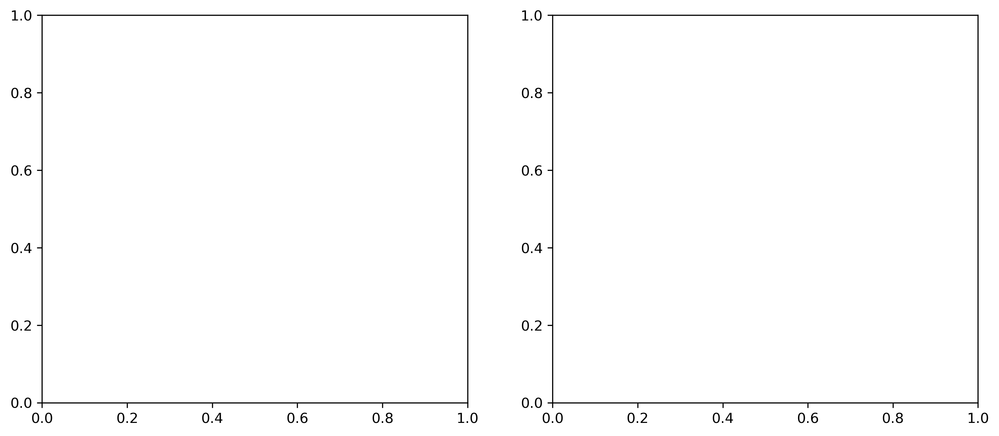

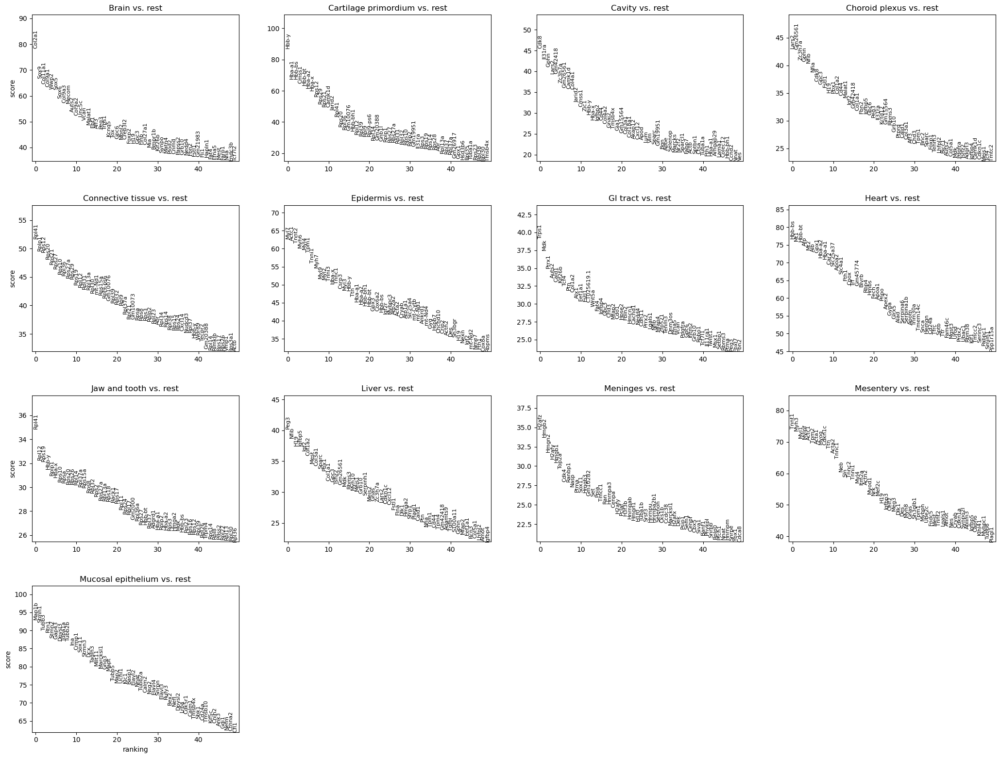

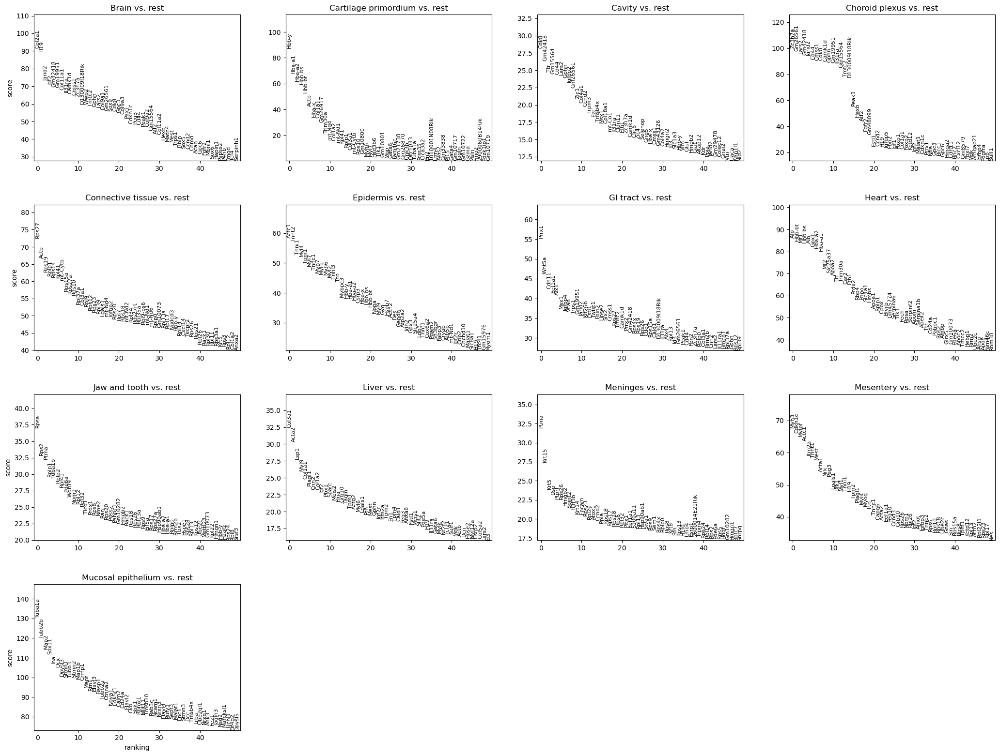

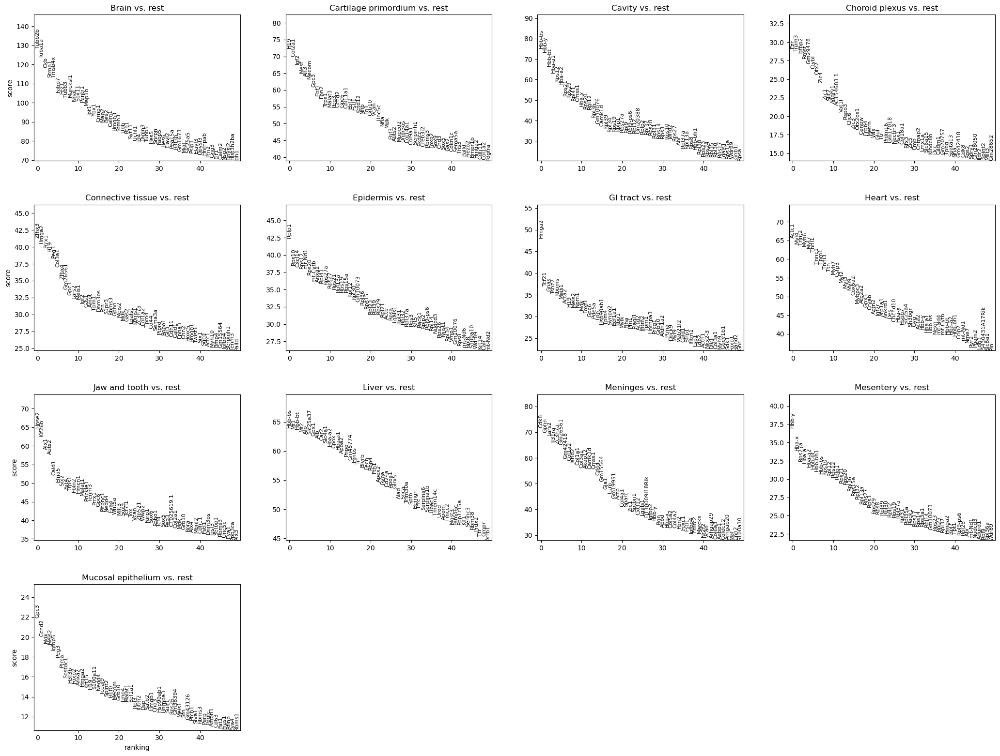

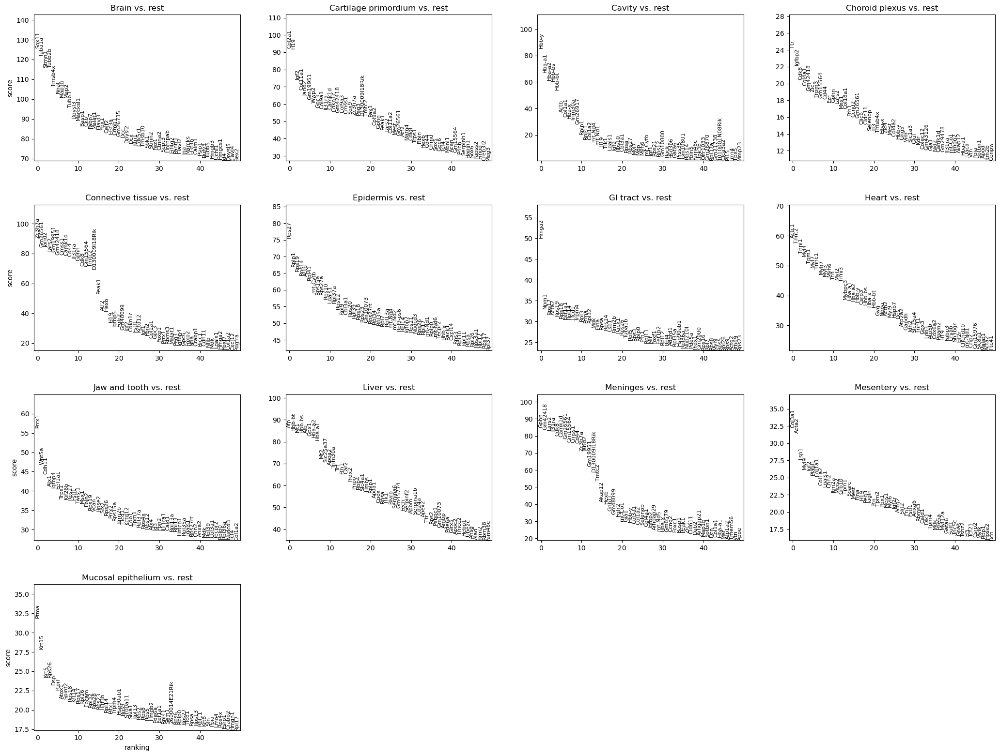

In [26]:
import matplotlib.pyplot as plt
import clustering_validation as cv

fig, axes = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

J1 = cv.get_Jaccard_Table(
    adatas[1], adatas[2],
    clustering_hmot_t1, clustering_hmot_t2,
    cluster_label='cluster',
    n_top_genes=50,
    overlap_lst=common_cluster_labels
)
J2 = cv.get_Jaccard_Table(
    adatas[1], adatas[2],
    clustering_ann_t1, clustering_ann_t2,
    cluster_label='cluster_ann',
    n_top_genes=50,
    overlap_lst=common_cluster_labels
)


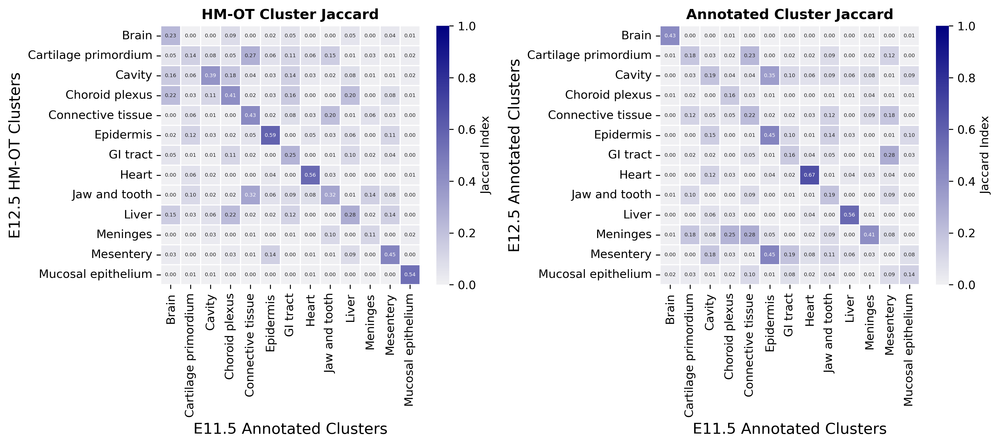

<Figure size 640x480 with 0 Axes>

In [27]:


fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5), dpi=300)

cv.plot_jaccard_matrix(J1, ax1, annot_text=True, title="HM-OT Cluster Jaccard",
                       x_lab='E11.5 Annotated Clusters', y_lab='E12.5 HM-OT Clusters')
cv.plot_jaccard_matrix(J2, ax2, annot_text=True, title="Annotated Cluster Jaccard",
                       x_lab='E11.5 Annotated Clusters', y_lab='E12.5 Annotated Clusters')

plt.tight_layout()
plt.show()

ax1.set_title("HM-OT Cluster Jaccard")
ax2.set_title("Annotated Cluster Jaccard")

plt.tight_layout()
plt.show()



In [28]:
NumHigher = np.sum(np.diag(J1.to_numpy()) > np.diag(J2.to_numpy())) 
Total = J1.to_numpy().shape[0]

print(f'{NumHigher}/{Total} with better Jaccard scores, for fraction { NumHigher/Total }')

8/13 with better Jaccard scores, for fraction 0.6153846153846154


In [30]:
print(np.mean(np.diag(J1)))
print(np.mean(np.diag(J2)))

0.36102560878557255
0.2887957198311067
